/var/folders/fs/jln5938953j241byxfr24hrw0000gn/T/ipykernel_83153/2650147107.py:46: RuntimeWarning: overflow encountered in scalar add
  output[i] = (a + b) / np.sqrt(2)     # average (low-pass)
/var/folders/fs/jln5938953j241byxfr24hrw0000gn/T/ipykernel_83153/2650147107.py:47: RuntimeWarning: overflow encountered in scalar subtract
  output[half + i] = (a - b) / np.sqrt(2)  # difference (high-pass)


57005
50388


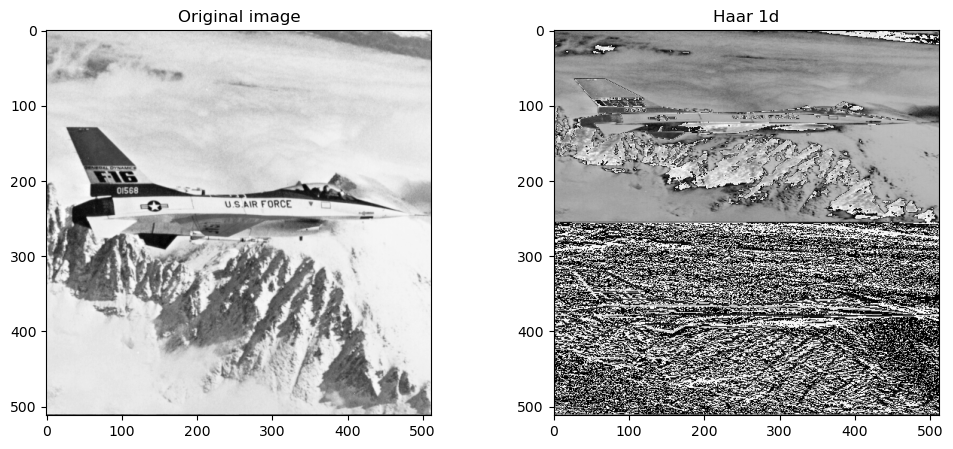

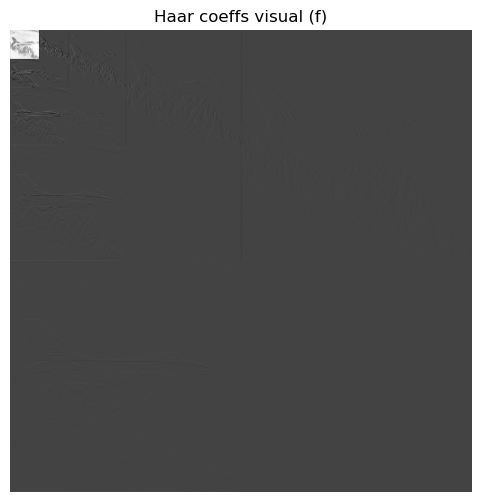

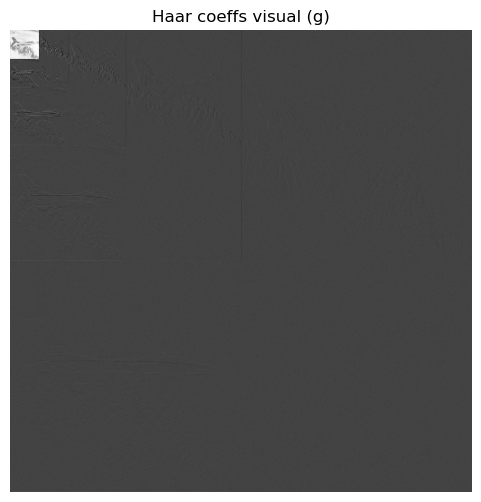

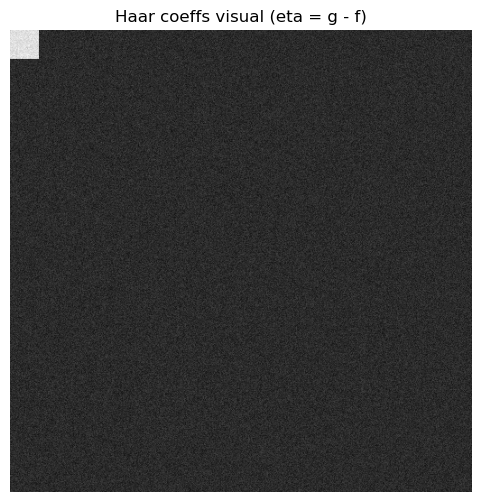

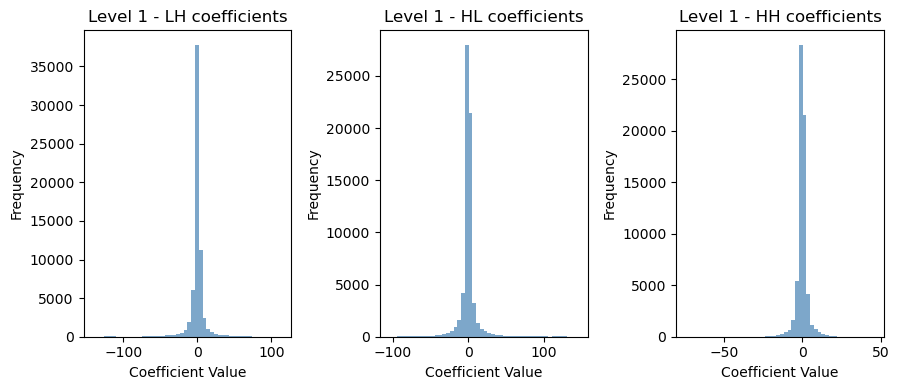

...

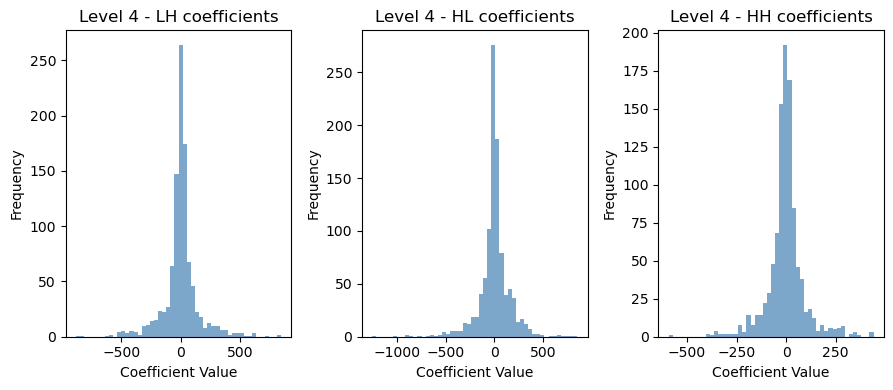

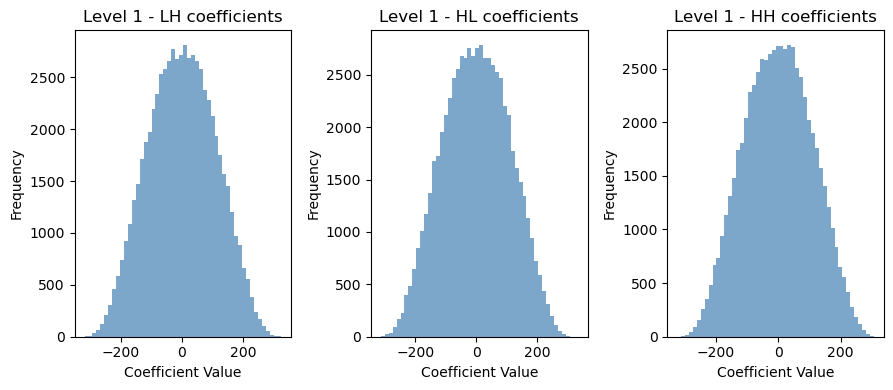

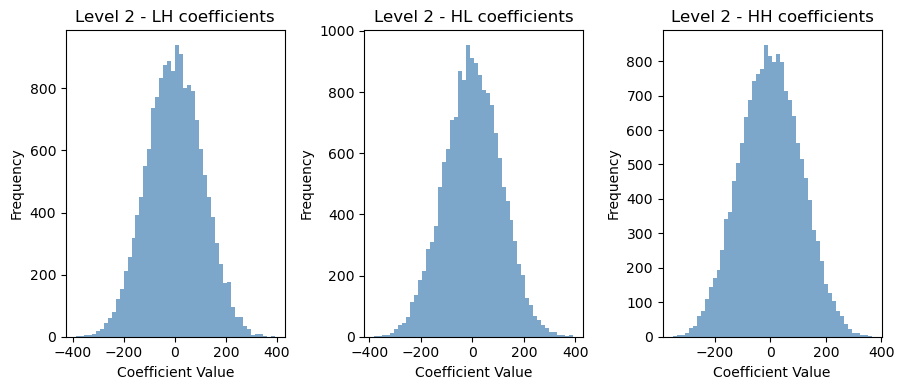

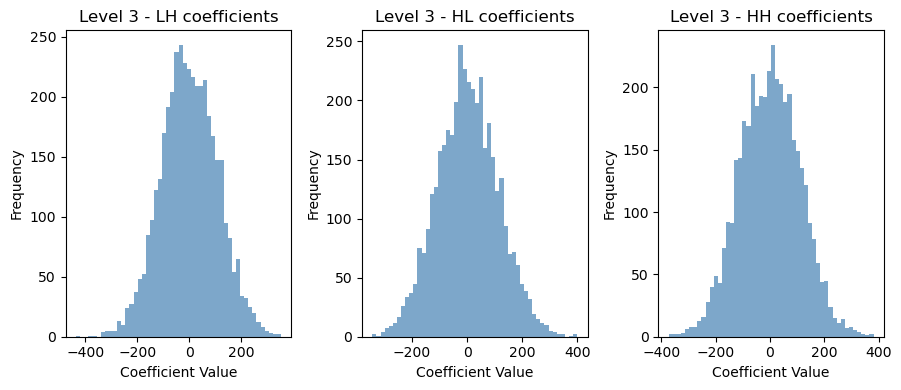

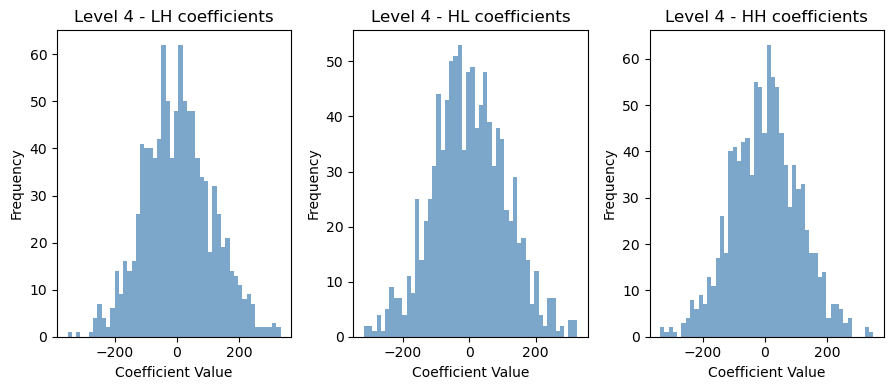

In [4]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr


def add_gaussian_noise(img, target_psnr=20):
    h, w = img.shape
    img = img.astype(np.float32)

    mse_target = (255 ** 2) / (10 ** (target_psnr / 10)) # psnr=10*log_10 (255^2/MSE)
    sigma = np.sqrt(mse_target)

    noise = np.random.normal(0, sigma, size=(h, w))
    noisy = img+noise
    noisy = np.clip(noisy, 0, 255).astype(np.float32)
    return noisy.astype(np.uint8)

def convolve(kernel, im):

    b, a=kernel.shape
    h, w=im.shape

    b1, a1 = (b)//2, (a)//2
    new_img=np.zeros((h, w))

    kernel = np.flipud(np.fliplr(kernel))
    pimg = np.pad(im,pad_width=((b1, b1), (a1, a1)),mode='reflect')

    for y in range(h):
        for x in range(w):
            window = pimg[y:y+b, x:x+a]
            new_img[y, x] = np.sum(window * kernel)
    return new_img
def downsample(arr):
    n = arr.shape[0]
    out = arr[0:n:2]
    return out

def haar_1d(arr):
    n = len(arr)
    output = np.zeros(n)
    half = n // 2
    for i in range(half):
        a, b = arr[2*i], arr[2*i+1]
        output[i] = (a + b) / np.sqrt(2)     # average (low-pass)
        output[half + i] = (a - b) / np.sqrt(2)  # difference (high-pass)
    return output
img=cv.imread("airplane.tif", cv.IMREAD_GRAYSCALE)  
h,w=img.shape
energy_orig=np.sum(img[h//2, :]**2)
mat=np.zeros_like(img)
for r in range(h):
    mat[r, :] = haar_1d(img[r, :]**2)
print(energy_orig)
for c in range(w):
    mat[:, c] = haar_1d(img[:, c])
energy_haar=np.sum(mat[h//2, :])
print(energy_haar)
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.title('Original image')
plt.imshow(img, cmap='grey')
plt.subplot(1,2,2)
plt.title('Haar 1d')
plt.imshow(mat, cmap='grey')


def db2_1d(arr):
    N = len(arr)
    s_odd = np.array(arr[0:N:2])
    s_even = np.array(arr[1:N:2])
    
    s = (np.sqrt(3)+1)*s_odd + (3+np.sqrt(3))*s_even + (3-np.sqrt(3))*(np.roll(s_odd, -1)) + (1-np.sqrt(3))*(np.roll(s_even, -1))
    d = (1-np.sqrt(3))*(np.roll(s_odd, 1)) + (np.sqrt(3)-3)*(np.roll(s_even, 1)) + (3+np.sqrt(3))*s_odd + (-1-np.sqrt(3))*s_even
    s = s / (4*np.sqrt(2))
    d = d / (4*np.sqrt(2))
    s=list(s)
    d=list(d)
    return np.array(s+d)
def multilevel_haar(matrix, levels):
    mat = matrix.copy().astype(float)
    nrows, ncols = mat.shape
    rows, cols = mat.shape
    mat_new = matrix.copy().astype(float)
    for level in range(levels):
        rows, cols=nrows//2**level, ncols//2**level
        for r in range(rows):
            mat[r, :cols] = haar_1d(mat[r, :cols])
        
        for c in range(cols):
            mat[:rows, c] = haar_1d(mat[:rows, c])
    
    return mat
def multilevel_db2(matrix, levels):
    mat = matrix.copy().astype(float)
    nrows, ncols = mat.shape
    rows, cols = mat.shape
    for level in range(levels):
        rows, cols=nrows//2**level, ncols//2**level
        for r in range(rows):
            mat[r, :cols] = db2_1d(mat[r, :cols])
        
        for c in range(cols):
            mat[:rows, c] = db2_1d(mat[:rows, c])
        
    
    return mat

def experiment(im):
    
    noisy = add_gaussian_noise(im, target_psnr=20)
    noisy_psnr = psnr(im, noisy, data_range=255)

    eta = noisy - im
    
    levels = 4
    img_f = multilevel_haar(im, levels=levels)
    img_g = multilevel_haar(noisy, levels=levels)
    img_eta = multilevel_haar(eta, levels=levels)
    
    plt.figure(figsize=(6,6))
    plt.title('Haar coeffs visual (f)')
    plt.imshow(img_f, cmap='gray')
    cv.imwrite("haar_f.png", img_f+128)
    cv.imwrite("haar_g.png", img_g+128)

    plt.axis('off')
    
    plt.figure(figsize=(6,6))
    plt.title('Haar coeffs visual (g)')
    plt.imshow(img_g, cmap='gray')
    plt.axis('off')
    
    plt.figure(figsize=(6,6))
    plt.title('Haar coeffs visual (eta = g - f)')
    plt.imshow(img_eta, cmap='gray')
    plt.axis('off')
    plt.show()
    nrows, ncols = img_f.shape
    img = img_f.copy()
    coeffs_f = []

    for l in range(1, levels + 1):
        rows = nrows // (2 ** (l - 1))
        cols = ncols // (2 ** (l - 1))
        
        # Decompose only the current top-left LL region
        LL = img[:rows // 2, :cols // 2]
        LH = img[:rows // 2, cols // 2:cols]
        HL = img[rows // 2:rows, :cols // 2]
        HH = img[rows // 2:rows, cols // 2:cols]
        
        coeffs_f.append((LL, LH, HL, HH))  # store only detail coeffs
        img = LL  # next level operates on LL only

    # Plot histograms of all detail coefficients level-wise
    for level, (LL, LH, HL, HH) in enumerate(coeffs_f, start=1):
        plt.figure(figsize=(12, 4))
        for i, (coeff, title) in enumerate(zip([LH, HL, HH], ['LH', 'HL', 'HH'])):
            plt.subplot(1, 4, i + 1)
            plt.hist(coeff.ravel(), bins=50, color='steelblue', alpha=0.7)
            plt.title(f'Level {level} - {title} coefficients')
            plt.xlabel('Coefficient Value')
            plt.ylabel('Frequency')
        plt.tight_layout()
        plt.show()
    nrows, ncols = img_g.shape
    img = img_g.copy()
    coeffs_g = []

    for l in range(1, levels + 1):
        rows = nrows // (2 ** (l - 1))
        cols = ncols // (2 ** (l - 1))
        
        # Decompose only the current top-left LL region
        LL = img[:rows // 2, :cols // 2]
        LH = img[:rows // 2, cols // 2:cols]
        HL = img[rows // 2:rows, :cols // 2]
        HH = img[rows // 2:rows, cols // 2:cols]
        
        coeffs_g.append((LL, LH, HL, HH))  # store only detail coeffs
        img = LL  # next level operates on LL only

    # Plot histograms of all detail coefficients level-wise
    for level, (LL, LH, HL, HH) in enumerate(coeffs_g, start=1):
        plt.figure(figsize=(12, 4))
        for i, (coeff, title) in enumerate(zip([LH, HL, HH], ['LH', 'HL', 'HH'])):
            plt.subplot(1, 4, i + 1)
            plt.hist(coeff.ravel(), bins=50, color='steelblue', alpha=0.7)
            plt.title(f'Level {level} - {title} coefficients')
            plt.xlabel('Coefficient Value')
            plt.ylabel('Frequency')
        plt.tight_layout()
        plt.show()
            
    nrows, ncols = img_eta.shape
    img = img_eta.copy()
    coeffs_eta = []

    for l in range(1, levels + 1):
        rows = nrows // (2 ** (l - 1))
        cols = ncols // (2 ** (l - 1))
        
        # Decompose only the current top-left LL region
        LL = img[:rows // 2, :cols // 2]
        LH = img[:rows // 2, cols // 2:cols]
        HL = img[rows // 2:rows, :cols // 2]
        HH = img[rows // 2:rows, cols // 2:cols]
        
        coeffs_eta.append((LL, LH, HL, HH))  # store only detail coeffs
        img = LL  # next level operates on LL only

    # Plot histograms of all detail coefficients level-wise
    for level, (LL, LH, HL, HH) in enumerate(coeffs_eta, start=1):
        plt.figure(figsize=(12, 4))
        for i, (coeff, title) in enumerate(zip([LH, HL, HH], ['LH', 'HL', 'HH'])):
            plt.subplot(1, 4, i + 1)
            plt.hist(coeff.ravel(), bins=50, color='steelblue', alpha=0.7)
            plt.title(f'Level {level} - {title} coefficients')
            plt.xlabel('Coefficient Value')
            plt.ylabel('Frequency')
        plt.tight_layout()
        plt.show()

    img_f = multilevel_db2(im, levels=levels)
    img_g = multilevel_db2(noisy, levels=levels)
    img_eta = multilevel_db2(eta, levels=levels)
    
    plt.figure(figsize=(6,6))
    plt.title('db2 coeffs visual (f)')
    plt.imshow(img_f, cmap='gray')
    cv.imwrite("db2_f.png", img_f+128)
    cv.imwrite("db2_g.png", img_g+128)
    
    plt.axis('off')
    
    plt.figure(figsize=(6,6))
    plt.title('db2 coeffs visual (g)')
    plt.imshow(img_g, cmap='gray')
    plt.axis('off')
    
    plt.figure(figsize=(6,6))
    plt.title('db2 coeffs visual (eta = g - f)')
    plt.imshow(img_eta, cmap='gray')
    plt.axis('off')
    plt.show()
    nrows, ncols = img_f.shape
    img = img_f.copy()
    coeffs_f = []

    for l in range(1, levels + 1):
        rows = nrows // (2 ** (l - 1))
        cols = ncols // (2 ** (l - 1))
        
        # Decompose only the current top-left LL region
        LL = img[:rows // 2, :cols // 2]
        LH = img[:rows // 2, cols // 2:cols]
        HL = img[rows // 2:rows, :cols // 2]
        HH = img[rows // 2:rows, cols // 2:cols]
        
        coeffs_f.append((LL, LH, HL, HH))  # store only detail coeffs
        img = LL  # next level operates on LL only

    # Plot histograms of all detail coefficients level-wise
    for level, (LL, LH, HL, HH) in enumerate(coeffs_f, start=1):
        plt.figure(figsize=(12, 4))
        for i, (coeff, title) in enumerate(zip([LH, HL, HH], ['LH', 'HL', 'HH'])):
            plt.subplot(1, 4, i + 1)
            plt.hist(coeff.ravel(), bins=50, color='steelblue', alpha=0.7)
            plt.title(f'Level {level} - {title} coefficients')
            plt.xlabel('Coefficient Value')
            plt.ylabel('Frequency')
        plt.tight_layout()
        plt.show()
    nrows, ncols = img_g.shape
    img = img_g.copy()
    coeffs_g = []

    for l in range(1, levels + 1):
        rows = nrows // (2 ** (l - 1))
        cols = ncols // (2 ** (l - 1))
        
        # Decompose only the current top-left LL region
        LL = img[:rows // 2, :cols // 2]
        LH = img[:rows // 2, cols // 2:cols]
        HL = img[rows // 2:rows, :cols // 2]
        HH = img[rows // 2:rows, cols // 2:cols]
        
        coeffs_g.append((LL, LH, HL, HH))  # store only detail coeffs
        img = LL  # next level operates on LL only

    # Plot histograms of all detail coefficients level-wise
    for level, (LL, LH, HL, HH) in enumerate(coeffs_g, start=1):
        plt.figure(figsize=(12, 4))
        for i, (coeff, title) in enumerate(zip([LH, HL, HH], ['LH', 'HL', 'HH'])):
            plt.subplot(1, 4, i + 1)
            plt.hist(coeff.ravel(), bins=50, color='steelblue', alpha=0.7)
            plt.title(f'Level {level} - {title} coefficients')
            plt.xlabel('Coefficient Value')
            plt.ylabel('Frequency')
        plt.tight_layout()
        plt.show()
            
    nrows, ncols = img_eta.shape
    img = img_eta.copy()
    coeffs_eta = []

    for l in range(1, levels + 1):
        rows = nrows // (2 ** (l - 1))
        cols = ncols // (2 ** (l - 1))
        
        # Decompose only the current top-left LL region
        LL = img[:rows // 2, :cols // 2]
        LH = img[:rows // 2, cols // 2:cols]
        HL = img[rows // 2:rows, :cols // 2]
        HH = img[rows // 2:rows, cols // 2:cols]
        
        coeffs_eta.append((LL, LH, HL, HH))  # store only detail coeffs
        img = LL  # next level operates on LL only

    # Plot histograms of all detail coefficients level-wise
    for level, (LL, LH, HL, HH) in enumerate(coeffs_eta, start=1):
        plt.figure(figsize=(12, 4))
        for i, (coeff, title) in enumerate(zip([LH, HL, HH], ['LH', 'HL', 'HH'])):
            plt.subplot(1, 4, i + 1)
            plt.hist(coeff.ravel(), bins=50, color='steelblue', alpha=0.7)
            plt.title(f'Level {level} - {title} coefficients')
            plt.xlabel('Coefficient Value')
            plt.ylabel('Frequency')
        plt.tight_layout()
        plt.show()
    
    return 
    # print("Detail coeffs counts:", details_f.size, details_g.size, details_eta.size)
    # print("Details (f) mean,std:", np.mean(details_f), np.std(details_f))
    # print("Details (g) mean,std:", np.mean(details_g), np.std(details_g))
    # print("Details (eta) mean,std:", np.mean(details_eta), np.std(details_eta))
    

if __name__ == "__main__":

    # Natural image X
    img = cv.imread("airplane.tif", cv.IMREAD_GRAYSCALE)  
    experiment(img)


Haar Transform


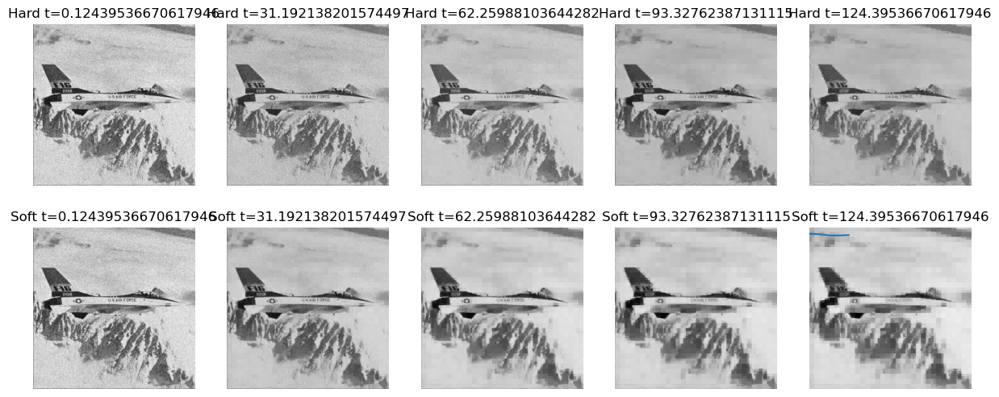

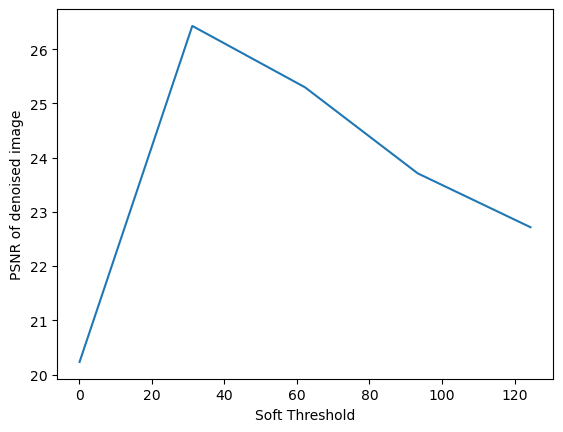

db2 Transform


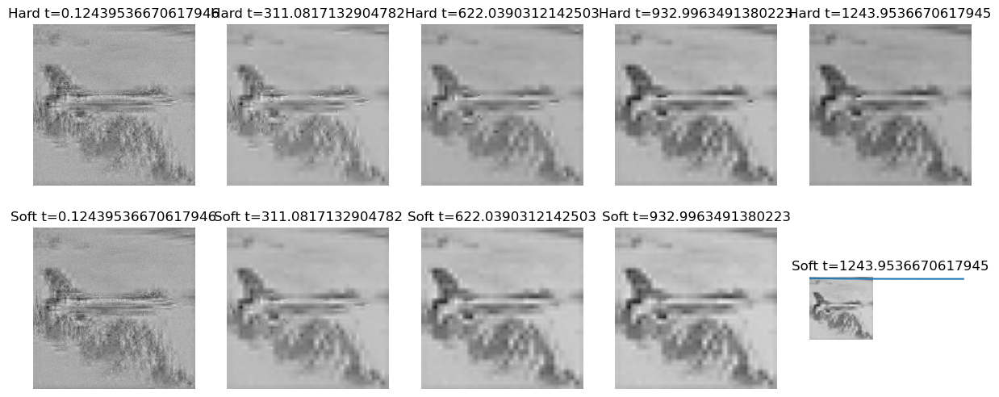

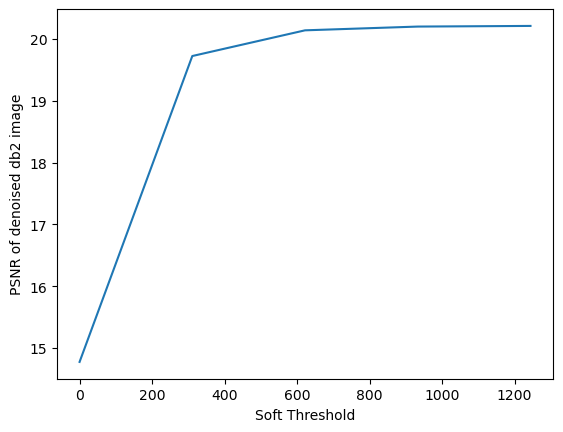

In [13]:
def add_gaussian_noise(img, target_psnr=20):
    h, w = img.shape
    img = img.astype(np.float32)

    mse_target = (255 ** 2) / (10 ** (target_psnr / 10)) # psnr=10*log_10 (255^2/MSE)
    sigma = np.sqrt(mse_target)

    noise = np.random.normal(0, sigma, size=(h, w))
    noisy = img+noise
    noisy = np.clip(noisy, 0, 255).astype(np.float32)
    return noisy.astype(np.uint8)

def hard_threshold(coeffs, t):
    new_coeffs=[]
    for c in coeffs:
        LL, LH, HL, HH=c
        LH_t=np.array([[0 if abs(LH[i,j])<=t else LH[i,j] for j in range(LH.shape[1])] for i in range(LH.shape[0])])
        HL_t=np.array([[0 if abs(HL[i,j])<=t else HL[i,j] for j in range(HL.shape[1])] for i in range(HL.shape[0])])
        HH_t=np.array([[0 if abs(HH[i,j])<=t else HH[i,j] for j in range(HH.shape[1])] for i in range(HH.shape[0])])
        new_coeffs.append((LL, LH_t, HL_t, HH_t))
    return np.asarray(new_coeffs, dtype="object")

def soft_threshold(coeffs, t):
    new_coeffs=[]
    for c in coeffs:
        LL, LH, HL, HH=c
        # LH=255*(LH-LH.min())/(LH.max()-LH.min())
        # HL=255*(HL-HL.min())/(HL.max()-HL.min())
        # HH=255*(HH-HH.min())/(HH.max()-HH.min())
        LH_t=np.array([[np.sign(LH[i, j])*max(abs(LH[i,j])-t, 0)  for j in range(LH.shape[1])] for i in range(LH.shape[0])])
        HL_t=np.array([[np.sign(HL[i, j])*max(abs(HL[i,j])-t, 0)  for j in range(HL.shape[1])] for i in range(HL.shape[0])])
        HH_t=np.array([[np.sign(HH[i, j])*max(abs(HH[i,j])-t, 0)  for j in range(HH.shape[1])] for i in range(HH.shape[0])])
        new_coeffs.append((LL, LH_t, HL_t, HH_t))
    return np.asarray(new_coeffs, dtype="object")

def haar_1d_inverse(coefs):
    s=0.5**0.5
    n = len(coefs)
    assert n % 2 == 0
    out = np.zeros_like(coefs, dtype=float)
    half = n // 2
    for i in range(half):
        scoef = coefs[i]
        dcoef = coefs[half + i]
        out[2*i]     = (scoef + dcoef) * s
        out[2*i + 1] = (scoef - dcoef) * s
    return out
def idwt2d_one_level(LL, LH, HL, HH):
    
    r, c = LL.shape
    # assemble tmp2 in the packed format
    rows = r * 2
    cols = c * 2
    tmp2 = np.zeros((rows, cols), dtype=float)
    tmp2[:r, :c] = LL
    tmp2[:r, c:cols] = LH
    tmp2[r:rows, :c] = HL
    tmp2[r:rows, c:cols] = HH
    tmp = np.zeros_like(tmp2)
    for j in range(cols):
        tmp[:, j] = haar_1d_inverse(tmp2[:, j])
    out = np.zeros_like(tmp)
    for i in range(rows):
        out[i, :] = haar_1d_inverse(tmp[i, :])
    return out
def inverse_haar_multi(coeffs):
    mat = coeffs[-1][0].copy().astype(float)
    # iterate levels in reverse (from deepest back to level1)
    for LL, LH, HL, HH in reversed(coeffs):
        mat = idwt2d_one_level(mat, LH, HL, HH)
    return mat
def convolve(kernel, im):

    b, a=kernel.shape
    h, w=im.shape

    b1, a1 = (b)//2, (a)//2
    new_img=np.zeros((h, w))

    kernel = np.flipud(np.fliplr(kernel))
    pimg = np.pad(im,pad_width=((b1, b1), (a1, a1)),mode='reflect')

    for y in range(h):
        for x in range(w):
            window = pimg[y:y+b, x:x+a]
            new_img[y, x] = np.sum(window * kernel)
    return new_img
def inverse_db2_1d(coef):
    n=len(coef)
    s=coef[:n//2]
    d=coef[n//2:]
    arr=np.zeros(n)
    # mat = np.zeros(n)
    # d1 = d * ((np.sqrt(3) - 1) / np.sqrt(2))
    # s2 = s * ((np.sqrt(3) + 1) / np.sqrt(2))
    # s1 = s2 + np.roll(d1, -1)
    # mat[1::2] = d1 + np.sqrt(3)/4 * s1 + (np.sqrt(3) - 2) / 4 * np.roll(s1, 1)
    # mat[0::2] = s1 - np.sqrt(3) * mat[1:n:2]
    g = np.array([-0.129410, -0.224144, 0.836516, -0.482963
    ])
    h = np.array([0.482963, 0.836516, 0.224144, -0.129410])
    # Upsample and convolve
    up_cA = np.zeros(n)
    up_cA[::2] = s
    up_cA=np.pad(up_cA, pad_width=(2,2), mode='reflect')
    up_cD = np.zeros(n)
    up_cD[::2] = d
    up_cD=np.pad(up_cD, pad_width=(2,2), mode='reflect')
    rec = np.convolve(up_cA, h, mode='full') + np.convolve(up_cD, g, mode='full')
    return rec[2:n+2]
def inv_db2_1_level(LL, LH, HL, HH):
    r, c = LL.shape
    # assemble tmp2 in the packed format
    rows = r*2
    cols = c*2
    tmp2 = np.zeros((rows, cols), dtype=float)
    tmp2[:r, :c] = LL
    tmp2[:r, c:cols] = LH
    tmp2[r:rows, :c] = HL
    tmp2[r:rows, c:cols] = HH
    tmp = np.zeros_like(tmp2)
    for j in range(cols):
        tmp[:, j] = inverse_db2_1d(tmp2[:, j])
    out = np.zeros_like(tmp)
    for i in range(rows):
        out[i, :] = inverse_db2_1d(tmp[i, :])
    return out
    
def inverse_db2_multi(coeffs):
    
    mat = coeffs[-1][0].copy().astype(float)
    for LL, LH, HL, HH in reversed(coeffs):
        
        mat= inv_db2_1_level(mat, LH, HL, HH)
    return mat
def run(im):
    target_psnr=20
    mse_target = (255 ** 2) / (10 ** (target_psnr / 10)) # psnr=10*log_10 (255^2/MSE)
    sigma = np.sqrt(mse_target)
    h, w=im.shape
    t_est=sigma*np.sqrt(2*np.log(h*w)/(h*w))
    t_values = np.linspace(0.5*t_est, 500*t_est, num=5)

    noisy = add_gaussian_noise(im, target_psnr=20)

    eta = noisy - im
    
    levels = 4
    img_f = multilevel_haar(im, levels=levels)
    img_g = multilevel_haar(noisy, levels=levels)
    img_eta = multilevel_haar(eta, levels=levels)
    
    nrows, ncols = img_f.shape
    img = img_f.copy()
    coeffs_f = []

    for l in range(1, levels + 1):
        rows = nrows // (2 ** (l - 1))
        cols = ncols // (2 ** (l - 1))
        
        # Decompose only the current top-left LL region
        LL = img[:rows // 2, :cols // 2]
        LH = img[:rows // 2, cols // 2:cols]
        HL = img[rows // 2:rows, :cols // 2]
        HH = img[rows // 2:rows, cols // 2:cols]
        
        coeffs_f.append((LL, LH, HL, HH))  # store only detail coeffs
        img = LL  # next level operates on LL only]
    new_psnr_hard=[]
    new_psnr_soft=[]
    fig, axes = plt.subplots(2, len(t_values), figsize=(15, 6))

    for i, t in enumerate(t_values):
        nrows, ncols = img_g.shape
        img = img_g.copy()
        coeffs_g = []

        for l in range(1, levels + 1):
            rows = nrows // (2 ** (l - 1))
            cols = ncols // (2 ** (l - 1))
            LL = np.array(img[:rows // 2, :cols // 2])
            LH = np.array(img[:rows // 2, cols // 2:cols])
            HL = np.array(img[rows // 2:rows, :cols // 2])
            HH = np.array(img[rows // 2:rows, cols // 2:cols])
            
            coeffs_g.append([LL, LH, HL, HH])  
            
            img = LL  # next level operates on LL only
        coeffs_g=np.asarray(coeffs_g, dtype="object")
        new_psnr_hard.append(psnr(im, inverse_haar_multi(hard_threshold(coeffs_g, t)), data_range=255))
        new_psnr_soft.append(psnr(im, inverse_haar_multi(soft_threshold(coeffs_g, t)), data_range=255))
        axes[0, i].imshow(inverse_haar_multi(hard_threshold(coeffs_g, t)), cmap='gray')
        axes[0, i].set_title(f"Hard t={t}")
        axes[0, i].axis('off')
        
        # Row 2 — Soft threshold
        axes[1, i].imshow(inverse_haar_multi(soft_threshold(coeffs_g, t)), cmap='gray')
        axes[1, i].set_title(f"Soft t={t}")
        axes[1, i].axis('off')
        cv.imwrite(f"img_hard_threshold_{t}.png", inverse_haar_multi(hard_threshold(coeffs_g, t)))
        cv.imwrite(f"img_soft_threshold_{t}.png", inverse_haar_multi(soft_threshold(coeffs_g, t)))
    cv.imwrite("img_noisy.png", noisy)
    plt.plot(t_values, new_psnr_hard)
    plt.ylabel('PSNR of denoised image')
    plt.xlabel('Hard Threshold')
    plt.show()
    plt.plot(t_values, new_psnr_soft)
    plt.ylabel('PSNR of denoised image')
    plt.xlabel('Soft Threshold')
    plt.show()

def run_db2(im):
    target_psnr=20
    mse_target = (255 ** 2) / (10 ** (target_psnr / 10)) # psnr=10*log_10 (255^2/MSE)
    sigma = np.sqrt(mse_target)
    h,w=im.shape
    t_est=sigma*np.sqrt(2*np.log(h*w)/(h*w))
    t_values = np.linspace(0.5*t_est, 5000*t_est, num=5)

    noisy = add_gaussian_noise(im, target_psnr=20)

    eta = noisy - im
    
    levels = 4
    img_f = multilevel_db2(im, levels=levels)
    img_g = multilevel_db2(noisy, levels=levels)
    img_eta = multilevel_db2(eta, levels=levels)
    
    nrows, ncols = img_f.shape

    new_psnr_hard=[]
    new_psnr_soft=[]
    fig, axes = plt.subplots(2, len(t_values), figsize=(15, 6))

    for i, t in enumerate(t_values):
        nrows, ncols = img_g.shape
        img = img_g.copy()
        coeffs_g = []

        for l in range(1, levels + 1):
            rows = nrows // (2 ** (l - 1))
            cols = ncols // (2 ** (l - 1))
            LL = np.array(img[:rows // 2, :cols // 2])
            LH = np.array(img[:rows // 2, cols // 2:cols])
            HL = np.array(img[rows // 2:rows, :cols // 2])
            HH = np.array(img[rows // 2:rows, cols // 2:cols])
            
            coeffs_g.append([LL, LH, HL, HH])  
            
            img = LL  # next level operates on LL only
            
        coeffs_g=np.asarray(coeffs_g, dtype="object")
        new_psnr_hard.append(psnr(im, inverse_db2_multi(hard_threshold(coeffs_g, t)), data_range=255))
        new_psnr_soft.append(psnr(im, inverse_db2_multi(soft_threshold(coeffs_g, t)), data_range=255))

        cv.imwrite(f"img_db2_hard_threshold_{t}.png", inverse_db2_multi(hard_threshold(coeffs_g, t)))
        cv.imwrite(f"img_db2_soft_threshold_{t}.png", inverse_db2_multi(soft_threshold(coeffs_g, t)))
        axes[0, i].imshow(inverse_db2_multi(hard_threshold(coeffs_g, t)), cmap='gray')
        axes[0, i].set_title(f"Hard t={t}")
        axes[0, i].axis('off')
        
        # Row 2 — Soft threshold
        axes[1, i].imshow(inverse_db2_multi(soft_threshold(coeffs_g, t)), cmap='gray')
        axes[1, i].set_title(f"Soft t={t}")
        axes[1, i].axis('off')
    plt.plot(t_values, new_psnr_hard)
    plt.ylabel('PSNR of denoised db2 image')
    plt.xlabel('Hard Threshold')
    plt.show()
    plt.plot(t_values, new_psnr_soft)
    plt.ylabel('PSNR of denoised db2 image')
    plt.xlabel('Soft Threshold')
    plt.show()

img = cv.imread("airplane.tif", cv.IMREAD_GRAYSCALE)  
h, w =img.shape
img=img[:h-(h%16), :w-(w%16)]
print("Haar Transform")
run(img)
print("db2 Transform")
run_db2(img)

[[ 0.0000000e+00  2.8610229e-06  1.9073486e-06 ...  1.1444092e-05
   6.6757202e-06  1.3351440e-05]
 [ 0.0000000e+00  2.8610229e-06  3.8146973e-06 ... -1.9073486e-06
  -4.7683716e-06  8.5830688e-06]
 [-1.9073486e-06  0.0000000e+00  0.0000000e+00 ...  9.5367432e-07
  -3.8146973e-06  1.1444092e-05]
 ...
 [ 3.8146973e-06  0.0000000e+00  3.8146973e-06 ... -5.7220459e-06
  -1.4305115e-05  7.6293945e-06]
 [ 0.0000000e+00 -5.7220459e-06 -4.7683716e-06 ... -6.6757202e-06
  -7.6293945e-06  2.8610229e-06]
 [ 2.8610229e-06 -1.9073486e-06  9.5367432e-07 ... -4.7683716e-06
  -5.7220459e-06  2.8610229e-06]]
PSNR: 22.75 dB
Total nonzero coefficients: 3535


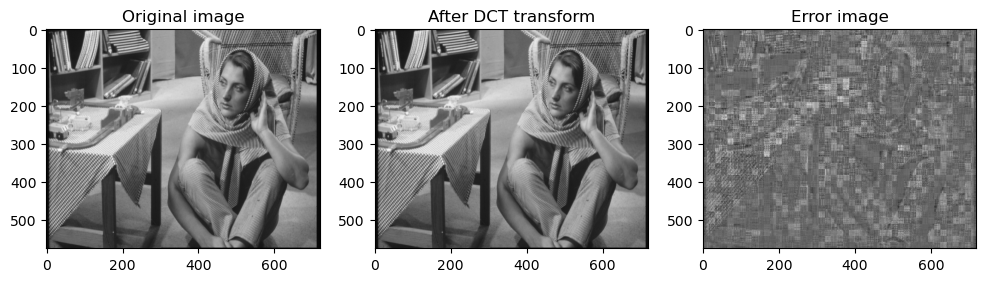

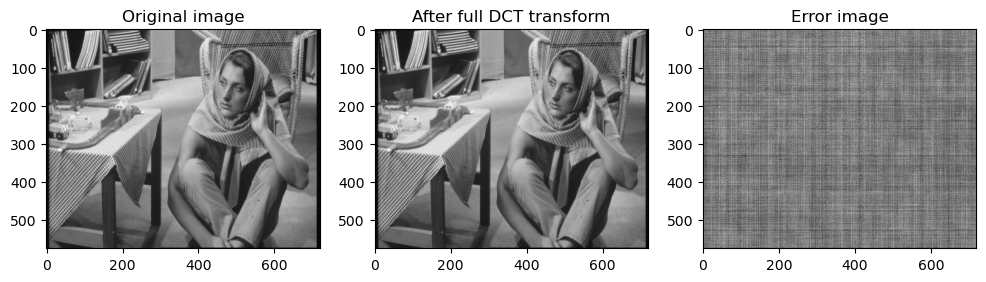

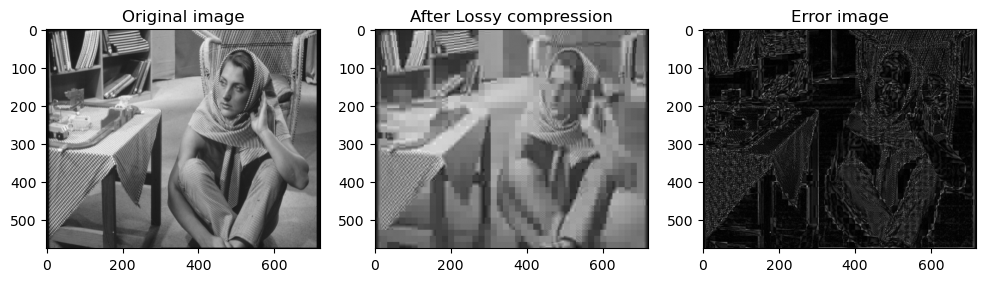

In [42]:
import cv2 as cv
import numpy as np

img = cv.imread("barbara.bmp", cv.IMREAD_GRAYSCALE)
h, w=img.shape
img=img[:h-h%16, :w-w%16]
def dct_block(im, block_size=16):
    im = np.float32(im)
    dct_blocks=np.zeros_like(im, dtype=np.float32)
    recon=np.zeros_like(im, dtype=np.float32)
    h, w=im.shape
    for i in range(0, h, block_size):
        for j in range(0, w, block_size):
            block=im[i:i+block_size, j:j+block_size]
            dct_bloc=cv.dct(block)
            dct_blocks[i:i+block_size, j:j+block_size]=dct_bloc
            recon[i:i+block_size, j:j+block_size]=cv.idct(dct_bloc)
    cv.imwrite('img_recon_dct_blocks.png', recon)
    return dct_blocks, recon
dct_blocks, recon=dct_block(img)
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.title('Original image')
plt.imshow(img, cmap='gray')
plt.subplot(1, 3, 2)
plt.title('After DCT transform')
plt.imshow(recon, cmap='gray')
plt.subplot(1, 3, 3)
plt.title('Error image')
plt.imshow(img-recon, cmap='gray')
print(img-recon)
def dct_overall(im):
    im = np.float32(im)
    dct_blocks=cv.dct(im)
    recon=cv.idct(dct_blocks)
    h, w=im.shape
    cv.imwrite('img_recon_dct_overall.png', recon)

    return recon
recon=dct_overall(img)
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.title('Original image')
plt.imshow(img, cmap='gray')
plt.subplot(1, 3, 2)
plt.title('After full DCT transform')
plt.imshow(recon, cmap='gray')
plt.subplot(1, 3, 3)
plt.title('Error image')
plt.imshow(img-recon, cmap='gray')
# def lossy_comp(im, dct, mse=25.5, block_size=16):
#     h, w = im.shape
#     dct_comp=dct.copy()
#     restored_f=np.zeros_like(im, dtype=np.float32)
#     c=0
#     for i in range(0, h, block_size):
#         for j in range(0, w, block_size):
#             dct_block=dct[i:i+block_size,j:j+block_size].copy().flatten()
#             dct_block=np.sort()
#             while dct :
#                 dct_comp[i:i+block_size,j:j+block_size]=np.zeros((block_size, block_size))
#                 c+=1
#             restored_f[i:i+block_size, j:j+block_size]=cv.idct(dct_comp[i:i+block_size,j:j+block_size])
#     cv.imwrite('img_recon_dct_lossy.png', restored_f)
#     return restored_f, dct_comp, c

# restored_f, dct_comp, c=lossy_comp(img, dct)
# print(c)

def lossy_comp(im, Imax=255, psnr_target=20, block_size=16):
    h, w = im.shape
    restored_f = np.zeros_like(im, dtype=np.float32)
    dct_comp = np.zeros_like(im, dtype=np.float32)

    mse_allowed = (block_size*0.1 * Imax)**2
    total_nonzero = 0

    for i in range(0, h, block_size):
        for j in range(0, w, block_size):
            block = im[i:i+block_size, j:j+block_size].astype(np.float32)
            k=0
            dct_block = cv.dct(block)
            flat = dct_block.flatten()
            energy_total = np.sum(flat**2)
            idx = np.argsort(np.abs(flat))  
            cum_energy = np.cumsum(flat[idx]**2)
            while k < len(cum_energy) - 1 and cum_energy[k]<=mse_allowed:
                k+=1
            flat[idx[:k]] = 0
            dct_comp[i:i+block_size, j:j+block_size] = flat.reshape(block_size, block_size)

            restored_f[i:i+block_size, j:j+block_size] = cv.idct(flat.reshape(block_size, block_size))

            total_nonzero += np.count_nonzero(flat)

    mse = np.mean((im - restored_f) ** 2)
    psnr = 10 * np.log10((Imax ** 2) / mse)

    cv.imwrite("img_recon_dct_lossy.png", restored_f)
    print(f"PSNR: {psnr:.2f} dB")
    print(f"Total nonzero coefficients: {total_nonzero}")

    # Error image
    error_image = np.abs(im - restored_f)
    cv.imwrite("error_image.png", error_image)

    return restored_f, dct_comp, total_nonzero, psnr, error_image
h, w=img.shape
restored_f, dct_comp, total_nonzero, psnr, error_image=lossy_comp(img)
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.title('Original image')
plt.imshow(img, cmap='gray')
plt.subplot(1, 3, 2)
plt.title('After Lossy compression')
plt.imshow(restored_f, cmap='gray')

plt.subplot(1, 3, 3)
plt.title('Error image')
plt.imshow(error_image, cmap='gray')

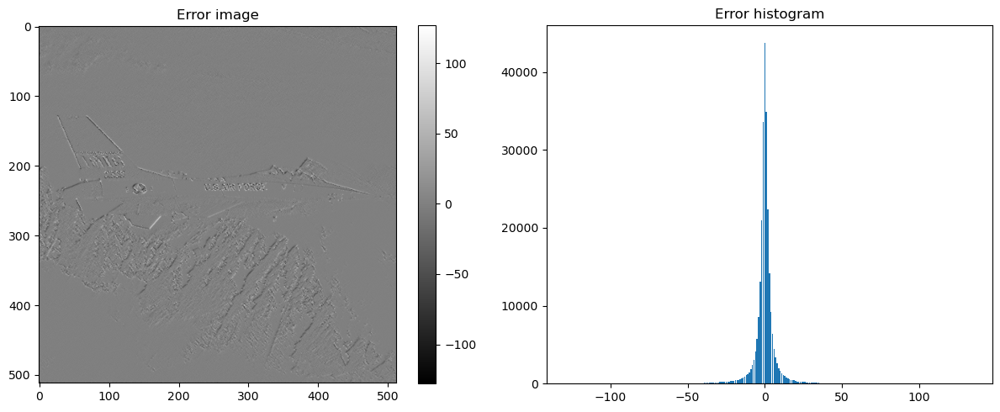

4.2785702566045565 7.471073747600231
{(-255,): -255, (-254,): -254, (-253,): -253, (-252,): -252, (-251,): -251, (-250,): -250, (-249,): -249, (-248,): -248, (-247,): -247, (-246,): -246, (-245,): -245, (-244,): -244, (-243,): -243, (-242,): -242, (-241,): -241, (-240,): -240, (-239,): -239, (-238,): -238, (-237,): -237, (-236,): -236, (-235,): -235, (-234,): -234, (-233,): -233, (-232,): -232, (-231,): -231, (-230,): -230, (-229,): -229, (-228,): -228, (-227,): -227, (-226,): -226, (-225,): -225, (-224,): -224, (-223,): -223, (-222,): -222, (-221,): -221, (-220,): -220, (-219,): -219, (-218,): -218, (-217,): -217, (-216,): -216, (-215,): -215, (-214,): -214, (-213,): -213, (-212,): -212, (-211,): -211, (-210,): -210, (-209,): -209, (-208,): -208, (-207,): -207, (-206,): -206, (-205,): -205, (-204,): -204, (-203,): -203, (-202,): -202, (-201,): -201, (-200,): -200, (-199,): -199, (-198,): -198, (-197,): -197, (-196,): -196, (-195,): -195, (-194,): -194, (-193,): -193, (-192,): -192, (-

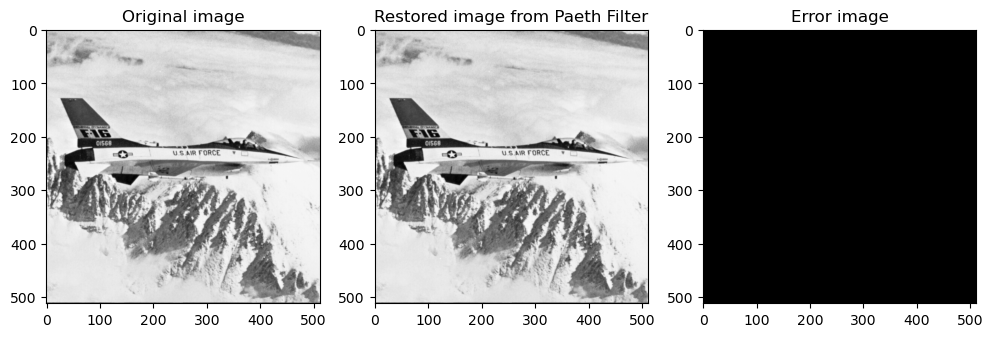

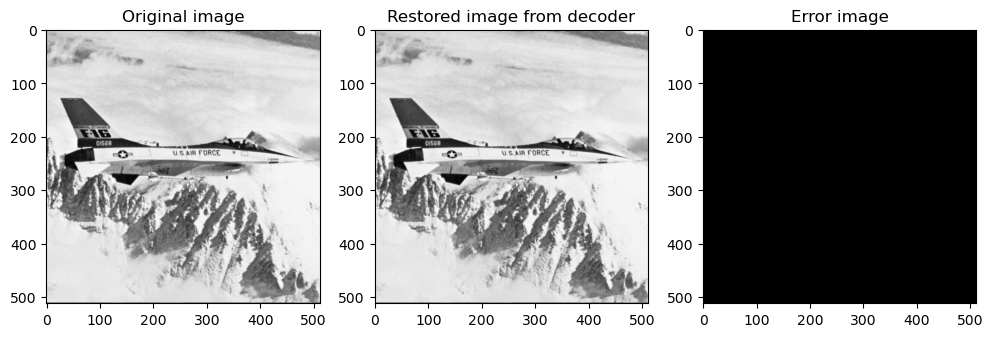

In [ ]:
import heapq
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
img = cv.imread("airplane.tif", cv.IMREAD_GRAYSCALE)
# img=np.ones((50, 50))*100
def PaethPredict (a, b, c):
   #a = left, b = above, c = upper left
    p = a + b - c        
    pa = abs(p - a)      
    pb = abs(p - b)
    pc = abs(p - c)
    # return nearest of a,b,c,
    # breaking ties in order a,b,c.
    if pa <= pb and pa <= pc:
        return a
    elif pb <= pc:
        return b
    else:
        return c
def PaethFilter(im):
    im = im.astype(np.int16)
    h, w =im.shape
    paeth=np.zeros_like(im)
    for i in range(1, h):
        for j in range(1, w):
            paeth[i,j]=im[i, j]-PaethPredict(im[i, max(j-1, 0)], im[max(i-1, 0), j], im[max(i-1, 0), max(j-1, 0)])
    paeth[0, 0]=im[0, 0]
    for j in range(1, w):
        paeth[0, j]=im[0,j]-im[0, j-1]
    for i in range(1, h):
        paeth[i, 0]=im[i,0]-im[i-1, 0]
    return paeth

error_image=PaethFilter(img)
e_mod = np.mod(error_image, 256).astype(np.uint8)
cv.imwrite('error_image.png', error_image)
def reconstruct_from_error(e):
    h, w =e.shape
    im=np.zeros_like(e)
    im[0,0]=e[0,0]
    for j in range(1, w):
        im[0, j]=e[0,j]+im[0, j-1]
    for i in range(1, h):
        im[i, 0]=e[i,0]+im[i-1, 0]
    for i in range(1, h):
        for j in range(1, w):
            im[i,j]=e[i, j]+PaethPredict(im[i, max(j-1, 0)], im[max(i-1, 0), j], im[max(i-1, 0), max(j-1, 0)])
    
    return im
recon=reconstruct_from_error(error_image)
def error_stats(e):
    vals, counts = np.unique(e, return_counts=True)
    probs = counts / counts.sum()
    entropy = -np.sum(probs * np.log2(probs))
    std = np.std(e.astype(np.float64))
    return vals, counts, entropy, std
def plot_error_and_hist(e, title='Error image'):
    plt.figure(figsize=(12,5))
    plt.subplot(1,2,1)
    plt.imshow(e, cmap='grey', vmin=-128, vmax=127)
    plt.colorbar()
    plt.title(title)
    plt.subplot(1,2,2)
    vals, counts = np.unique(e.flatten(), return_counts=True)
    plt.bar(vals, counts)
    plt.title('Error histogram')
    plt.tight_layout()
    plt.show()

plot_error_and_hist(error_image)

plt.figure(figsize=(12,5))
plt.subplot(1,3,1)
plt.title('Original image')
plt.imshow(img, cmap='grey')
plt.subplot(1,3,2)
plt.title('Restored image from Paeth Filter')
plt.imshow(recon, cmap='grey')
plt.subplot(1,3,3)
plt.title('Error image')
plt.imshow(recon-img, cmap='grey')
vals, counts, entropy_orig, std=error_stats(error_image.flatten())
print(entropy_orig, std)
constt=np.ones((50, 50))*100
def lzw_encode(im):
    im = im.astype(np.int16)
    im = im.astype(np.int16)
    h, w=im.shape
    arr=im.flatten()
 
    table={}
    for i in range(-255, 256):
        table[tuple([i])]=i
    p=[arr[0]]
    c=[]
    code=256
    prob={}
    output_code=[]
    for i in range(len(arr)):
        if i!=len(arr)-1:
            c.append(arr[i+1])
        if tuple(p+c) in table:
            p=p+c
        else:
            output_code.append(table[tuple(p)])

            table[tuple(p+c)]=code
            code+=1
            p=c
        c=[]
        
    output_code.append(table[tuple(p)])
    element_counts = Counter(output_code)  
    for element, count in element_counts.items():
        prob[element]=count/len(arr)
    h, w=error_image.shape
    length=0
    entropy=0
    print(table)
    for key, p in prob.items():
        if key!=0:
            length+=np.log2(abs(key))*p
        entropy+=-np.log2(p)*p
    print('Shannon Entropy after LZW: ', entropy)
    print('Length after LZW: ', length)
    print('Compression Ratio: ', 8/(length))
    return prob, table, code,output_code

def lzw_decode(h, w, code_arr):
    
    table={}
    for i in range(-255, 256):
        table[i]=[i]
    old=code_arr[0]
    s=table[old]
    c=[s[0]]
    output=[s[0]]
    count=256
    for i in range(len(code_arr)-1):
        n=code_arr[i+1]
        if n not in table:
            s=table[old]
            s=s+c
        else:
            s=table[n]
        c=[s[0]]
        output+=s
        table[count]=table[old]+c
        count+=1
        old=n
         
    output=np.array(output)
    img=output.reshape((h, w))
    
    return img


class Node:
    def __init__(self, data, p):
        self.left=None
        self.right=None
        self.data = data
        self.p=p
    def __lt__(self, other):
        return self.p < other.p

def preorder(root, node, curr): #root->left->right
	if root is None:
		return

	if root.left is None and root.right is None:
		node.append(curr)
		return

	preorder(root.left, node, curr + '0')
	preorder(root.right, node, curr + '1')

def storeCodes(root, str, codes):
    
    if root is None:
        return
    if root.data != None:
        codes[root.data] = str
    storeCodes(root.left, str + "0", codes)
    storeCodes(root.right, str + "1", codes)

minheap=[]
def huffman(prob):
    
    global minheap
    for key, value in prob.items():
        minheap.append(Node(key, value))
    heapq.heapify(minheap)
    while len(minheap)>=2:
        l=heapq.heappop(minheap)
        r=heapq.heappop(minheap)
        n=Node(None, l.p+r.p)
        n.left=l
        n.right=r
        heapq.heappush(minheap, n)
    codes={}
    storeCodes(minheap[0], "", codes)
    return codes
def printCodes(root, str):
    if root is None:
        return
    if root.data != None:
        print(root.data, ":", str)
    printCodes(root.left, str + "0")
    printCodes(root.right, str + "1")

def huffman_decode(huffman_table, encoded_bits):
    # ans=[]
    # curr=root
    # n=len(code)
    # for i in range(n):
    #     if code[i]=='0':
    #         curr=curr.left
    #     else:
    #         curr=curr.right
    #     if curr.left is None and curr.right is None:
    #         ans.append(curr.data)
    #         curr=root
    # return ans
    reverse_table = {v: k for k, v in huffman_table.items()}
    
    decoded_symbols = []
    current_code = ""
    
    for bit in encoded_bits:
        current_code += bit
        if current_code in reverse_table:
            decoded_symbols.append(reverse_table[current_code])
            current_code = ""  
    return decoded_symbols


def encoder(img):
    h, w=img.shape
    error_image=PaethFilter(img)
    prob,table, max_code, code=lzw_encode(error_image)
    entropy_orig=0
    for key, p in prob.items():
        entropy_orig+=-p*np.log2(p)
    print(code)
    codes=huffman(prob)
    encoded_bits = ''.join(codes[c] for c in code)
    
    avg_l_huffman=0
    print("Symbol : Huffman Code")
    for symbol, s in sorted(codes.items()):
        avg_l_huffman+=prob[symbol]*len(s)
        print(f" {symbol}: {s}")
    print("Expected Length of Huffman encoding: ", avg_l_huffman)
    print('Overall Compression Ratio: ', 8*h*w/len(encoded_bits))
    print('LZW Compression Ratio: ', 8/entropy_orig)
    return codes, encoded_bits
def decoder(M, N, T, b):
    lzw_codes=huffman_decode(T, b)
    recon_lzw_img=lzw_decode(M, N, lzw_codes)
    im=reconstruct_from_error(recon_lzw_img)
    cv.imwrite('recon_lzw_img.png', im)
    return im

codes, encoded_bits=encoder(img)
h, w=img.shape
recov=decoder(h,w,codes, encoded_bits)
plt.figure(figsize=(12,5))
plt.subplot(1,3,1)
plt.title('Original image')
plt.imshow(img, cmap='grey')
plt.subplot(1,3,2)
plt.title('Restored image from decoder')
plt.imshow(recov, cmap='grey')
plt.subplot(1,3,3)
plt.title('Error image')
plt.imshow(recov-img, cmap='grey')
